In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tensorflow.keras.utils import load_img
import os
warnings.filterwarnings('ignore')

### Create dataframe for Vehicle Images and their Labels

In [5]:
input_path = []
label = []

for vehicle_type in os.listdir('VehicleImages'):
    for path in os.listdir('VehicleImages/' + vehicle_type):
        if(vehicle_type == 'Buses'):
            label.append('bus')
        elif (vehicle_type == 'Cars'):
            label.append('car')
        else:
            label.append('motorbike')
        input_path.append(os.path.join('VehicleImages', vehicle_type, path))


In [6]:
len(input_path)

22326

In [7]:
df = pd.DataFrame()
df['Images'] = input_path
df['Label'] = label

df.head()

,Images,Label
0,VehicleImages\Buses\002JGLBCECX3.jpg,bus
1,VehicleImages\Buses\00UKLKUPNJUL.jpg,bus
2,VehicleImages\Buses\00ZQ7C8UTBAY.jpg,bus
3,VehicleImages\Buses\01H7UILLVW1O.jpg,bus
4,VehicleImages\Buses\01N8GW9FVDJP.jpg,bus


In [8]:
# Shuffle data
df = df.sample(frac=1).reset_index(drop=True)
df.head()

,Images,Label
0,VehicleImages\Cars\17705.jpg,car
1,VehicleImages\Motorbikes\PYVOT69N43VY.jpg,motorbike
2,VehicleImages\Cars\00852.jpg,car
3,VehicleImages\Cars\01005.jpg,car
4,VehicleImages\Buses\7CK5XXJM4ZAS.jpg,bus


# Data Anaylsis

In [9]:
import random

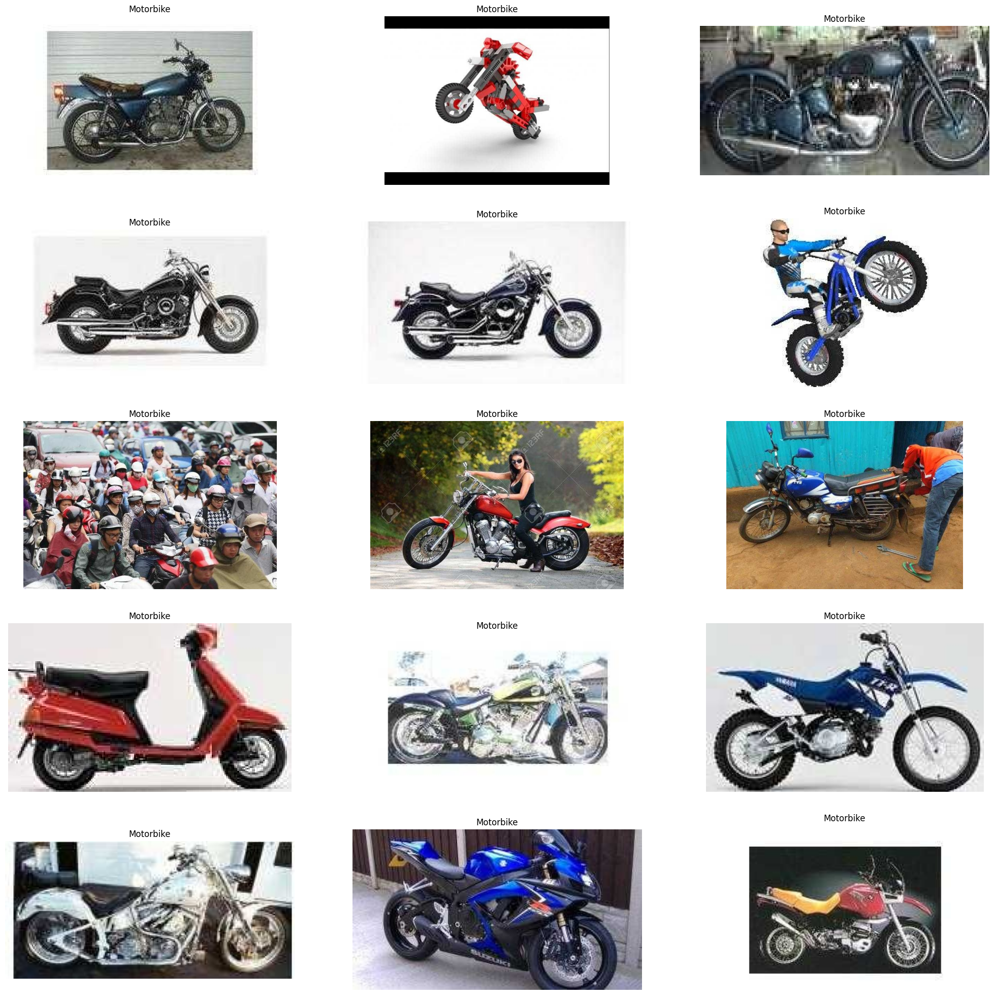

In [11]:
plt.figure(figsize=(25,25))
temp = df[df["Label"] == 'motorbike']['Images']
start = random.randint(0, len(temp))

# Here we get any random 15 images from our dataframe
files = temp[start:start+15]

for index , file in enumerate(files):
    plt.subplot(5, 3, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Motorbike')
    plt.axis('off')

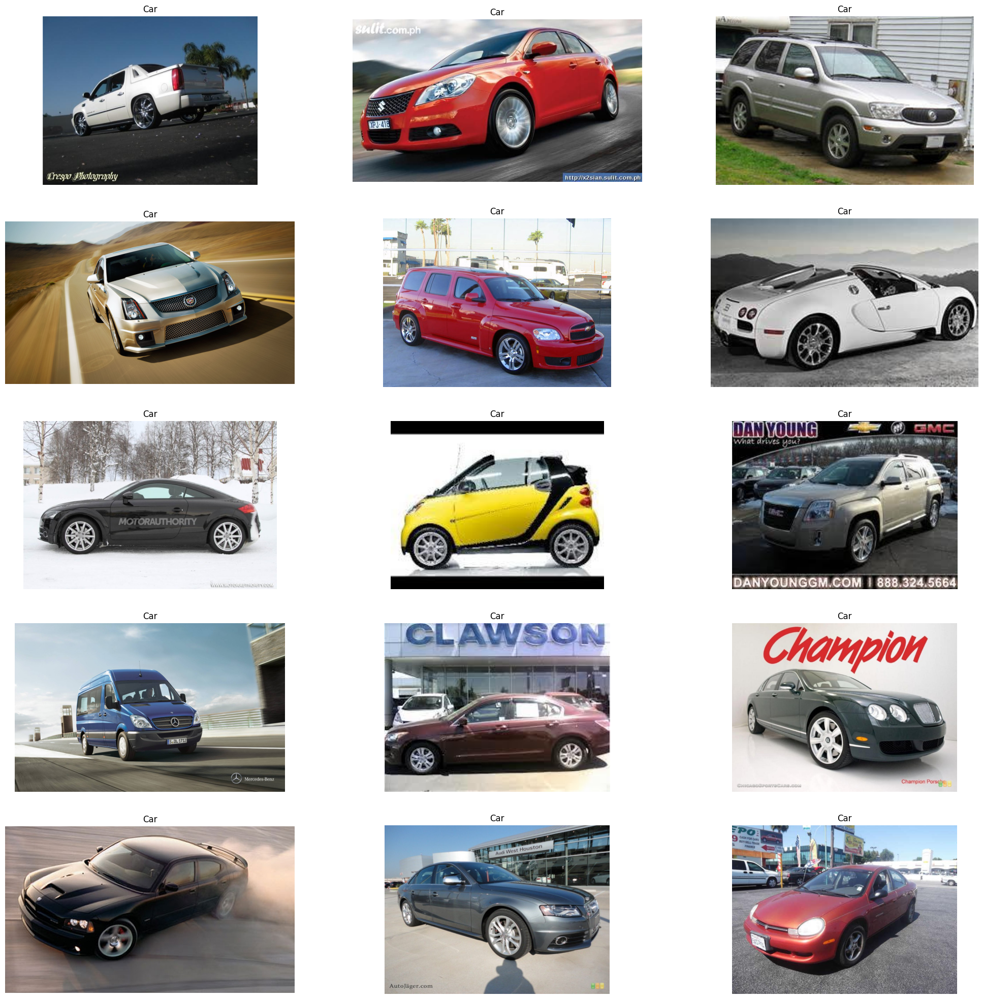

In [12]:
plt.figure(figsize=(25,25))
temp = df[df["Label"] == 'car']['Images']
start = random.randint(0, len(temp))

# Here we get any random 15 images from our dataframe
files = temp[start:start+15]

for index , file in enumerate(files):
    plt.subplot(5, 3, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Car')
    plt.axis('off')

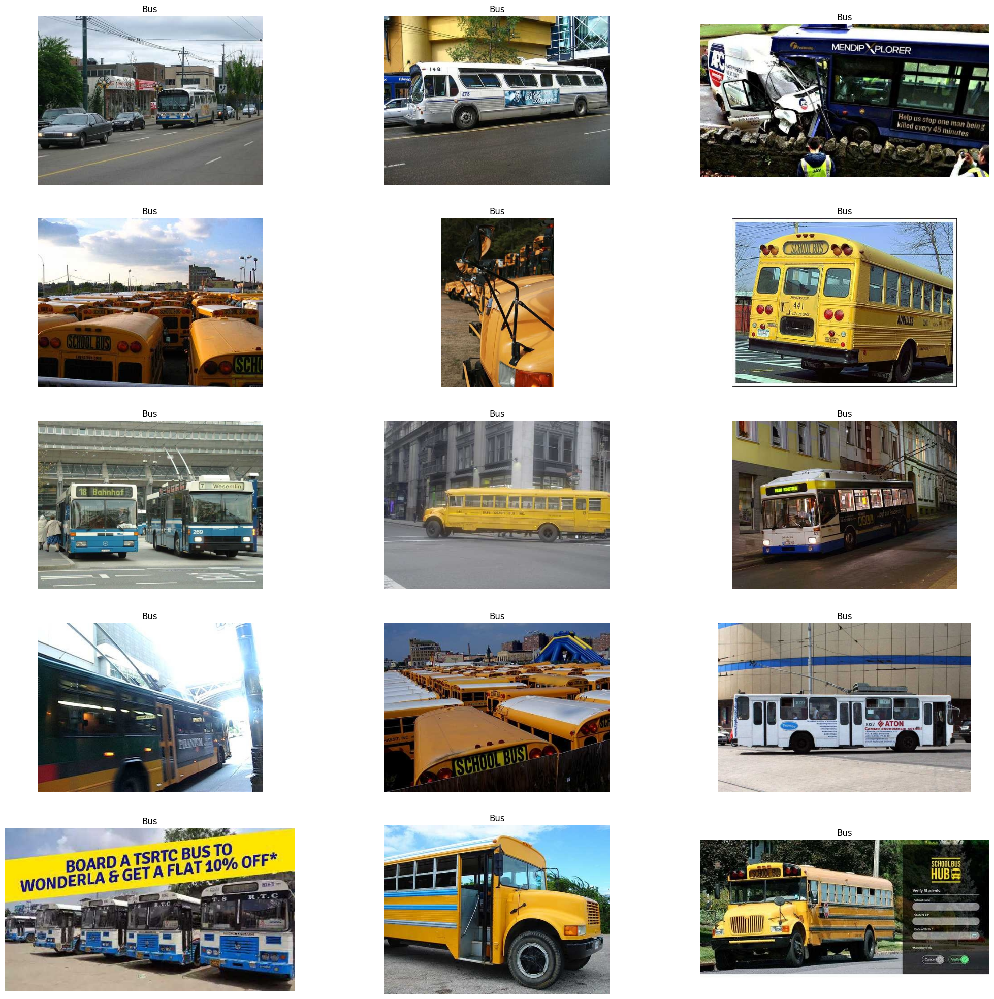

In [13]:
plt.figure(figsize=(25,25))
temp = df[df["Label"] == 'bus']['Images']
start = random.randint(0, len(temp))

# Here we get any random 15 images from our dataframe
files = temp[start:start+15]

for index , file in enumerate(files):
    plt.subplot(5, 3, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Bus')
    plt.axis('off')

<Axes: xlabel='Label'>

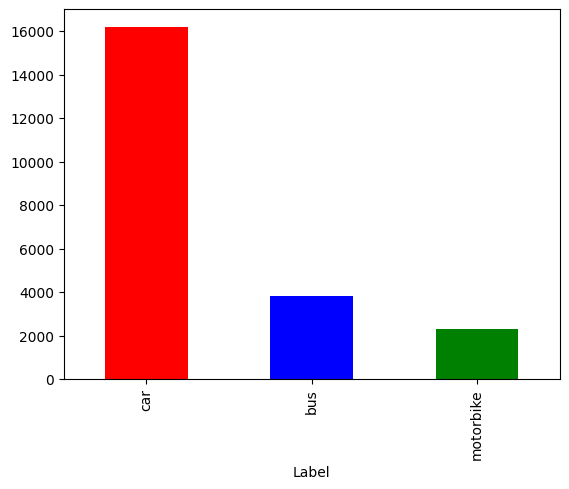

In [15]:
df.Label.value_counts().plot(kind='bar', color=['red', 'blue', 'green'])

# Augmentation and Creating Model

In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

In [18]:
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [19]:
train_generator = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='Images',
    y_col='Label',
    target_size=(128,128),
    batch_size = 512,
    class_mode = 'categorical'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='Images',
    y_col='Label',
    target_size=(128,128),
    batch_size = 512,
    class_mode = 'categorical'
)

Found 17860 validated image filenames belonging to 3 classes.
Found 4466 validated image filenames belonging to 3 classes.


In [81]:
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout

In [82]:
model = Sequential([
    Conv2D(16, (3,3), activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64, (3,3), activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

In [83]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 126, 126, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 63, 63, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 61, 61, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 30, 30, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12544)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     6,423,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,448,163 (24.60 MB)

 Trainable params: 6,448,163 (24.60 MB)

 Non-trainable params: 0 (0.00 B)

In [84]:
from sklearn.utils import class_weight

In [85]:
class_weights = class_weight.compute_class_weight(
                    class_weight='balanced',
                    classes=np.unique(df['Label']),
                    y=df['Label']
                )

In [86]:
class_weights_dict = dict(enumerate(class_weights))
print(class_weights_dict)

{0: 1.9370119729307653, 1: 0.4598084646277417, 2: 3.237059591126577}


In [87]:
history = model.fit(train_iterator, epochs=20, validation_data=val_iterator, class_weight=class_weights_dict)

Epoch 1/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 794s 19s/step - accuracy: 0.4196 - loss: 1.1052 - val_accuracy: 0.4884 - val_loss: 1.0095
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 745s 17s/step - accuracy: 0.7228 - loss: 0.6387 - val_accuracy: 0.8262 - val_loss: 0.4541
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 342s 8s/step - accuracy: 0.8076 - loss: 0.5083 - val_accuracy: 0.8213 - val_loss: 0.4642
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 341s 8s/step - accuracy: 0.8365 - loss: 0.4266 - val_accuracy: 0.8444 - val_loss: 0.4169
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 299s 7s/step - accuracy: 0.8550 - loss: 0.3896 - val_accuracy: 0.8498 - val_loss: 0.4082
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 278s 7s/step - accuracy: 0.8508 - loss: 0.4146 - val_accuracy: 0.8627 - val_loss: 0.3787
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 191s 5s/step - accuracy: 0.8688 - loss: 0.3651 - val_accuracy: 0.8300 - val_loss: 0.4567
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 226s 6s/step - accuracy: 0.8715 - loss: 0.3477 - val_accuracy: 0.8567 -

# Model Evaluation

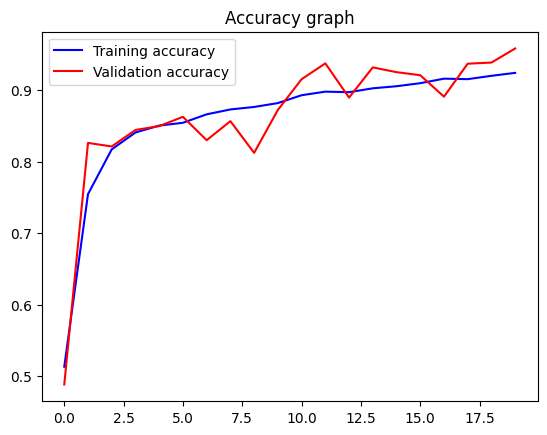

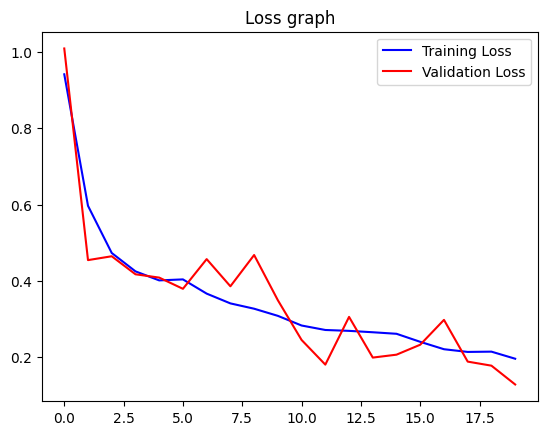

In [88]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation accuracy')
plt.title('Accuracy graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss graph')
plt.legend()
plt.show()

In [89]:
model.evaluate(val_iterator)

9/9 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.9588 - loss: 0.1250


[0.12763789296150208, 0.9583519697189331]

# Prediction

In [32]:
from tensorflow.keras.preprocessing import image

In [33]:
# Function to get the image as an array, pre-process to get the same dimensions as used in the model
def get_image_array(img_path, target_size=(128, 128)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions to match the input shape
    img_array /= 255.0  # Normalize the image
    return img_array

In [34]:
# Function to predict the label of the image
def predict_image(model, img_path):
    img_array = get_image_array(img_path)
    prediction = model.predict(img_array)

    return prediction

In [116]:
img_path = 'VehicleImages\\bus_test_102.jpg'

prediction = predict_image(model, img_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


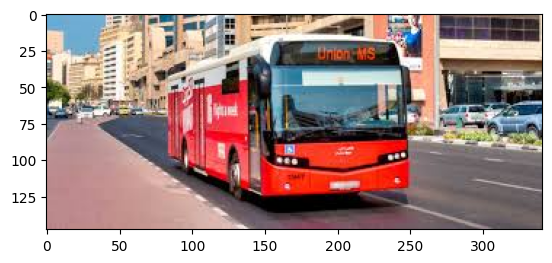

In [117]:
img = image.load_img(img_path)
plt.imshow(img)
plt.show()

In [118]:
print(f'Prediction: {prediction[0]}')

Prediction: [8.5992283e-01 1.4004296e-01 3.4201290e-05]


In [98]:
class_inds = train_iterator.class_indices
print(f'Class indices: {class_inds}')

Class indices: {'bus': 0, 'car': 1, 'motorbike': 2}


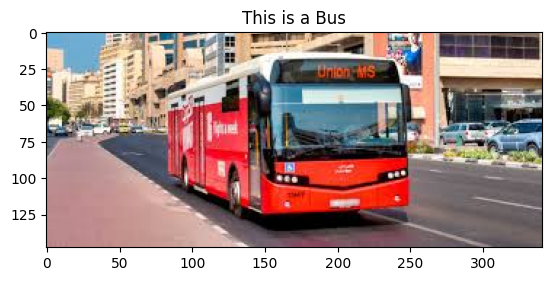

In [120]:
img = image.load_img(img_path)
plt.imshow(img)

if (prediction[0][0] > prediction[0][1] and prediction[0][0] > prediction[0][2]):
    plt.title(f'This is a Bus')
elif (prediction[0][1] > prediction[0][0] and prediction[0][1] > prediction[0][2]):
    plt.title(f'This is a Car')
else:
    plt.title(f'This is a Motorcycle')

plt.show()